In [1]:
## Tested using the following loaded modules
## module use /g/data/access/ngm/modules
## module load analysis3/21.10
import os, sys
workdir = "/g/data/xv83/users/bxn599/ACS/evaluation/"
os.chdir(workdir)
sys.path.append("./lib")
import glob
import xarray as xr
import numpy as np
import geopandas as gp
from datetime import datetime as dt
import lib_standards
import lib_spatial
import spatial_selection
import matplotlib as mpl
import matplotlib.pyplot as plt
import importlib
importlib.reload(lib_standards)
import warnings
warnings.filterwarnings('ignore')

font = {'size'   : 12}
mpl.rc('font', **font)

In [2]:
DATA_LOCATIONS = {
    'AGCD': "/g/data/xv83/users/bxn599/ACS/icclim_indices/AUS-r005/none/BOM-AGCD/historical/none/none/none/climdex",
    'ERA5': "/g/data/xv83/users/bxn599/ACS/icclim_indices/AUS-25/none/ECMWF-ERA5/historical/none/none/none/climdex",
    'CCAM:ERA5': "/g/data/xv83/users/bxn599/ACS/icclim_indices/AUS-10/CSIRO/ECMWF-ERA5/evaluation/none/CSIRO-CCAM-2203/v1/climdex",
#    'BARPA-R:ERA5': "/g/data/ia39/australian-climate-service/test-data/CORDEX-CMIP6/indices/AUS-15/BOM/ECMWF-ERA5/evaluation/none/BOM-BARPA-R/v1/climdex",
}
# Frequency of icclim indicator
FREQ = 'month'
# Data sources to consider here
SOURCES = ['CCAM:ERA5', 'AGCD', 'ERA5']
# Grid to used as the reference grid to compute difference metrics
REFERENCE_GRID = 'CCAM:ERA5'
# "Truth" for compute difference metrics
REFERENCE = 'AGCD'
# Region of interest, as per defined in lib_standards.DOMAINS
REGION = 'Australia'  
# Period of interest, as per defined in lib_standards.PERIODS
PERIOD = 'HISTORICAL_20' 
SEASON = 'all'

In [3]:
def prepare_data(index, sources=SOURCES, freq=FREQ, region=REGION, period=PERIOD, reference_grid=REFERENCE_GRID, season=SEASON):
    """
    Reads in the icclim data and regrid to the reference grid.
    """
    # Load the data sources
    ds = {}
    for s in sources:
        #print("Reading the data {:}".format(s))
        fs = glob.glob(os.path.join(DATA_LOCATIONS[s], index, "{index}_*_{freq}_*.nc".format(index=index, freq=freq)))
        ds[s] = xr.open_dataset(fs[0])
        ds[s] = lib_standards.standardise_data(ds[s], region=region, period=period, season=season, compute=True)

    # Regrid to the REFERENCE_GRID
    ds_regrid = {}
    for s in sources:
        #print("Regridding the data {:} to reference grid of {:}".format(s, reference_grid))
        #ds_regrid[s] = lib_spatial.add_region_land_mask(ds[s], region)
        ds_regrid[s] = ds[s]
        if s == reference_grid:
            ds_regrid[s] = ds_regrid[s].compute()
        else:
            ds_regrid[s] = lib_standards.regrid(ds_regrid[s], ds[reference_grid]).compute()
    return ds_regrid

In [4]:
# INDEXES = ['TX', 'TX:DJF', 'TX:MAM', 'TX:JJA', 'TX:SON']
# for index in INDEXES:
#     print("index = {:}".format(index))
    
#     # check whether the index has special conditions
#     index_condition = None
#     if not ":" in index:
#         # Prepare all the icclim data as per the setup in CONFIGURATIONS
#         ds = prepare_data(index)
#         clabel = "mean of {index}({freq})".format(index=index, freq=FREQ)
#     else:
#         index_condition = index.split(":")[1]
#         index = index.split(":")[0]
#         ds = prepare_data(index, season=index_condition)
#         clabel = "mean of {index}({index_condition})".format(index=index, index_condition=index_condition)
    
#     ds_target = {}
#     for s in SOURCES:
#         print(ds[s][index].time.min())
#         print(ds[s][index].time.max())
#         ds_target[s] = ds[s][index].mean(dim='time')
#         ds_target[s] = lib_spatial.apply_region_mask(ds_target[s], 'Australia')
#         if 'PRCPTOT' in index:
#             ds_target[s] = lib_spatial.apply_agcd_data_mask(ds_target[s])

#     if index in ['TX']:
#         cmap_variable = 'temp'
#         cmap_class = 'hot'
    
#     lib_standards.spatial_plot(ds_target, reference=REFERENCE, 
#                                cmap_variable=cmap_variable, cmap_class=cmap_class, 
#                                clabel=clabel, plot_difference=True,
#                                include_all_data=True, include_diff_avg=True)
#     plt.tight_layout()
#     #plt.savefig("./figs/tx/tx_%s_%s.png"%(index,index_condition),dpi=300)

# TXx: Maximum daily maximum temperature 

index = TXx
<xarray.DataArray 'time' ()>
array('1995-01-16T00:00:00.000000000', dtype='datetime64[ns]')
<xarray.DataArray 'time' ()>
array('2014-12-16T00:00:00.000000000', dtype='datetime64[ns]')
<xarray.DataArray 'time' ()>
array('1995-01-16T00:00:00.000000000', dtype='datetime64[ns]')
<xarray.DataArray 'time' ()>
array('2014-12-16T00:00:00.000000000', dtype='datetime64[ns]')
<xarray.DataArray 'time' ()>
array('1995-01-16T00:00:00.000000000', dtype='datetime64[ns]')
<xarray.DataArray 'time' ()>
array('2014-12-16T00:00:00.000000000', dtype='datetime64[ns]')
False
index = TXx:DJF
<xarray.DataArray 'time' ()>
array('1995-01-16T00:00:00.000000000', dtype='datetime64[ns]')
<xarray.DataArray 'time' ()>
array('2014-12-16T00:00:00.000000000', dtype='datetime64[ns]')
<xarray.DataArray 'time' ()>
array('1995-01-16T00:00:00.000000000', dtype='datetime64[ns]')
<xarray.DataArray 'time' ()>
array('2014-12-16T00:00:00.000000000', dtype='datetime64[ns]')
<xarray.DataArray 'time' ()>
array('1995-01-16

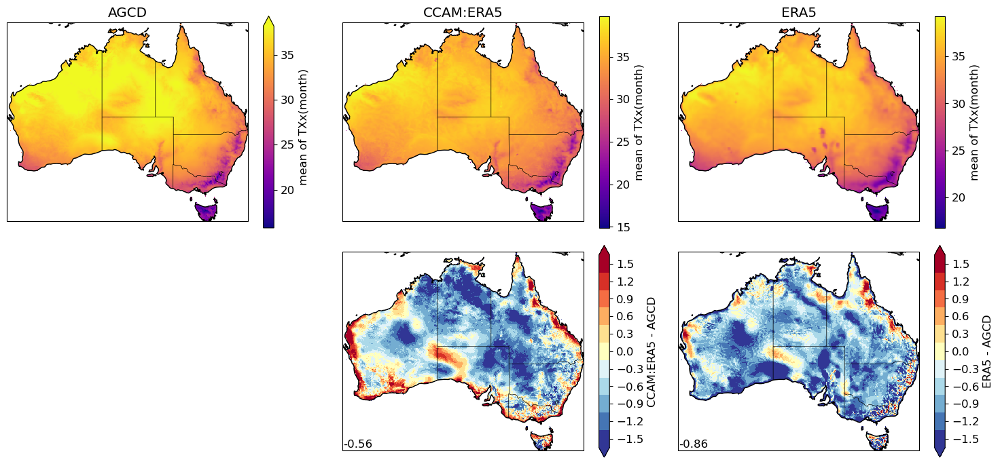

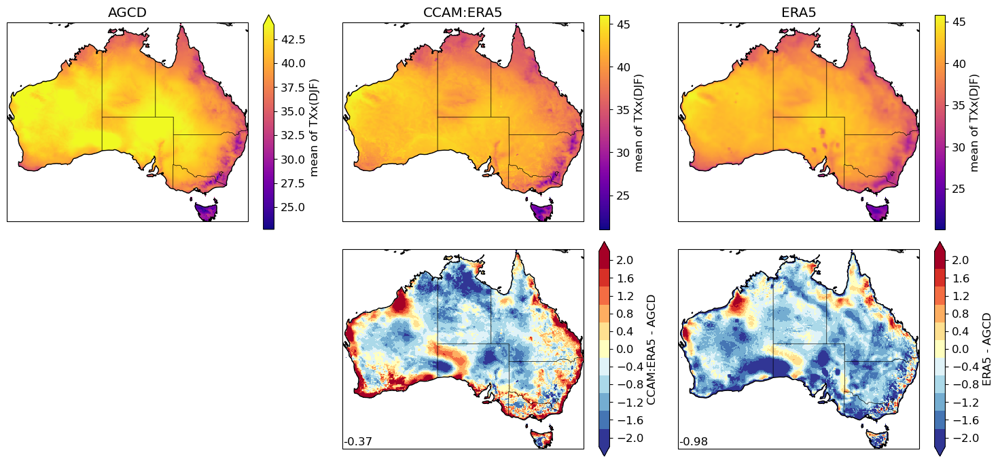

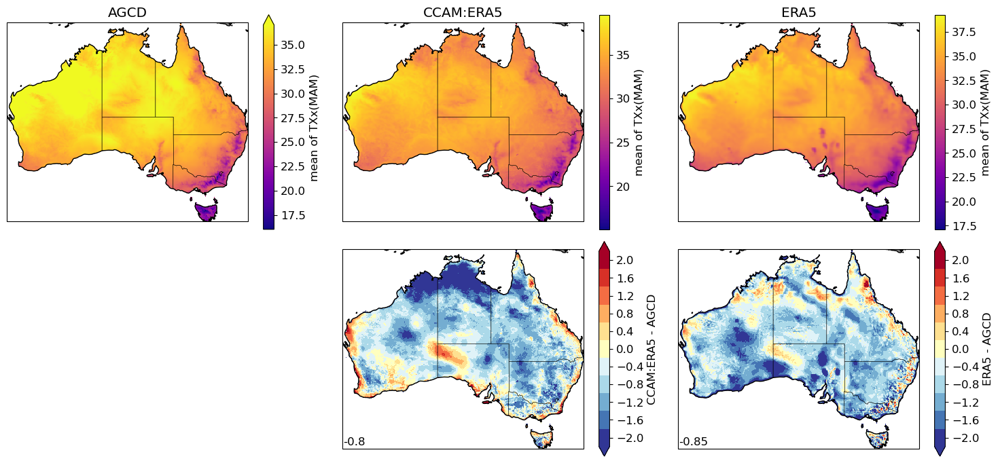

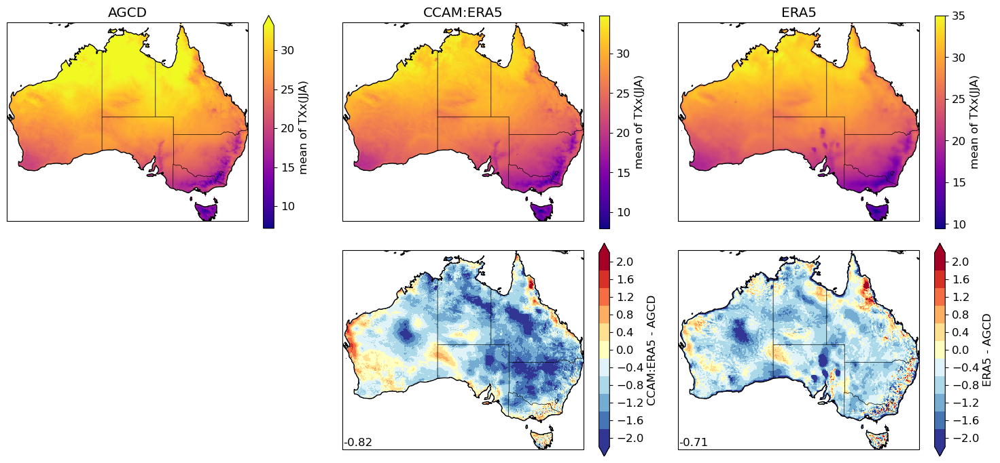

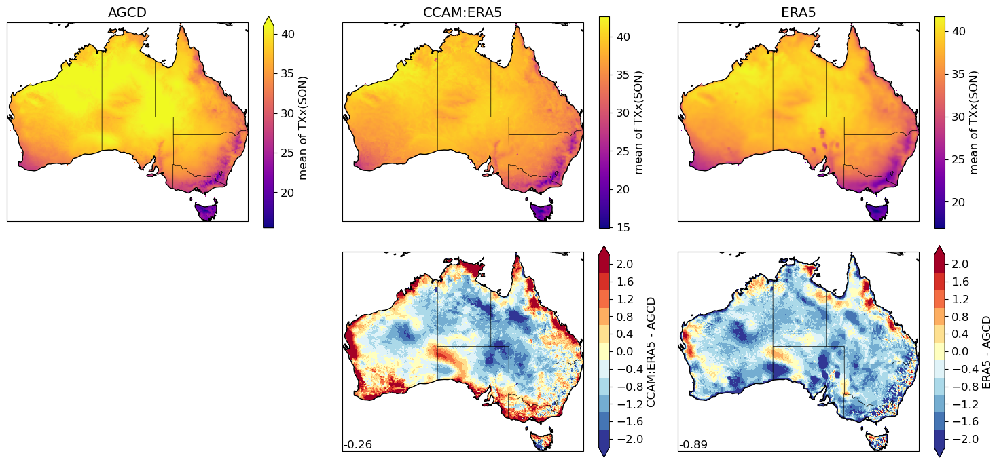

In [5]:
INDEXES = ['TXx', 'TXx:DJF', 'TXx:MAM', 'TXx:JJA', 'TXx:SON']
for index in INDEXES:
    print("index = {:}".format(index))
    
    # check whether the index has special conditions
    index_condition = None
    if not ":" in index:
        # Prepare all the icclim data as per the setup in CONFIGURATIONS
        ds = prepare_data(index)
        clabel = "mean of {index}({freq})".format(index=index, freq=FREQ)
    else:
        index_condition = index.split(":")[1]
        index = index.split(":")[0]
        ds = prepare_data(index, season=index_condition)
        clabel = "mean of {index}({index_condition})".format(index=index, index_condition=index_condition)
    
    ds_target = {}
    for s in SOURCES:
        print(ds[s][index].time.min())
        print(ds[s][index].time.max())
        ds_target[s] = ds[s][index].mean(dim='time')
        ds_target[s] = lib_spatial.apply_region_mask(ds_target[s], 'Australia')
        if 'PRCPTOT' in index:
            ds_target[s] = lib_spatial.apply_agcd_data_mask(ds_target[s])

    if index in ['TXx']:
        cmap_variable = 'temp'
        cmap_class = 'hot'
    
    lib_standards.spatial_plot(ds_target, reference=REFERENCE, 
                               cmap_variable=cmap_variable, cmap_class=cmap_class, 
                               clabel=clabel, plot_difference=True,
                               include_all_data=True, include_diff_avg=True)
    plt.tight_layout()
    plt.savefig("./extremes_paper_figs/tx_%s_mean_%s.png"%(index,index_condition),dpi=300)

# TXn: Minimum daily maximum temperature

index = TXn
False
index = TXn:DJF
False
index = TXn:MAM
False
index = TXn:JJA
False
index = TXn:SON
False


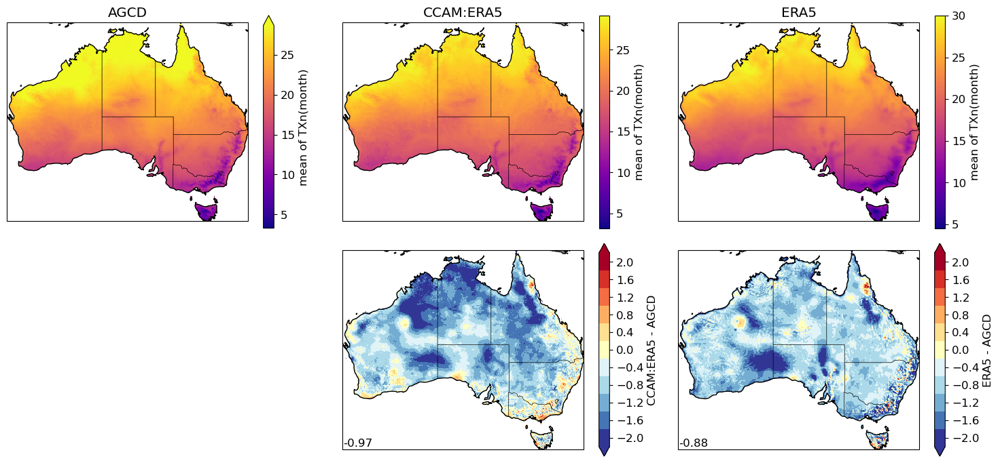

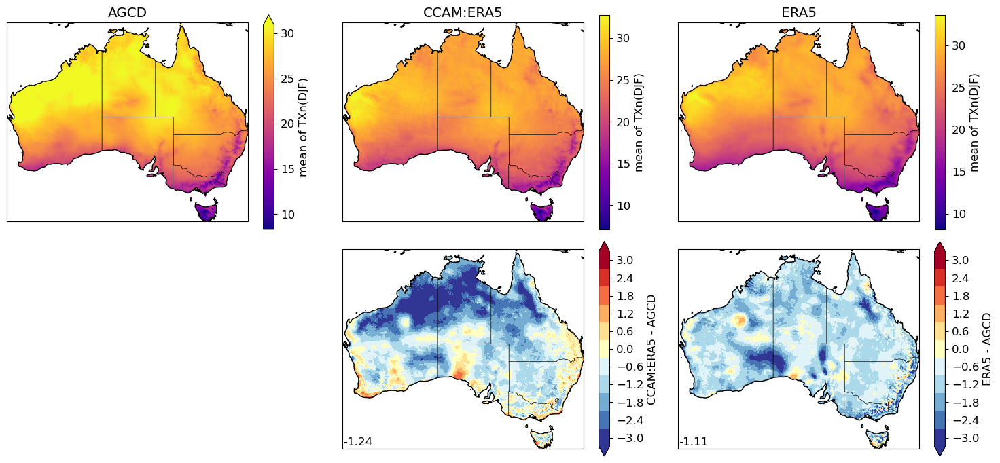

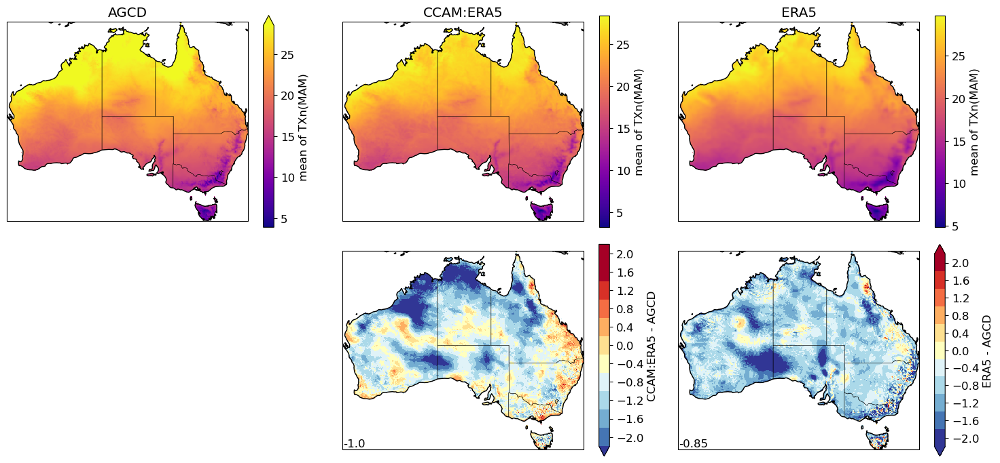

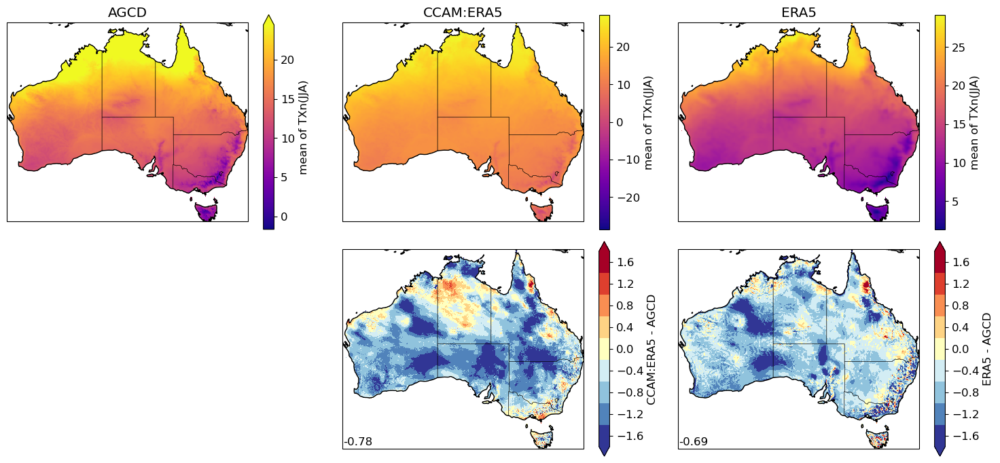

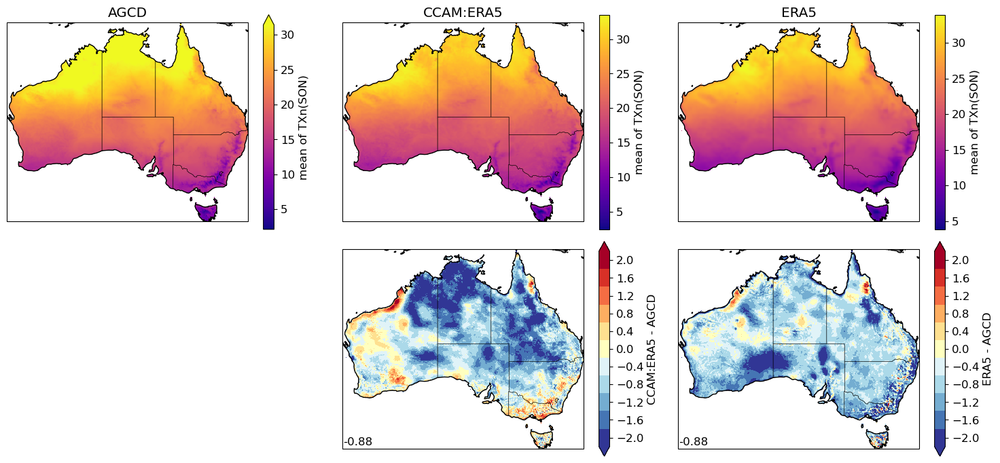

In [6]:
INDEXES = ['TXn', 'TXn:DJF', 'TXn:MAM', 'TXn:JJA', 'TXn:SON']
for index in INDEXES:
    print("index = {:}".format(index))
    
    # check whether the index has special conditions
    index_condition = None
    if not ":" in index:
        # Prepare all the icclim data as per the setup in CONFIGURATIONS
        ds = prepare_data(index)
        clabel = "mean of {index}({freq})".format(index=index, freq=FREQ)
    else:
        index_condition = index.split(":")[1]
        index = index.split(":")[0]
        ds = prepare_data(index, season=index_condition)
        clabel = "mean of {index}({index_condition})".format(index=index, index_condition=index_condition)
    
    ds_target = {}
    for s in SOURCES:
        ds_target[s] = ds[s][index].mean(dim='time')
        ds_target[s] = lib_spatial.apply_region_mask(ds_target[s], 'Australia')
        if 'PRCPTOT' in index:
            ds_target[s] = lib_spatial.apply_agcd_data_mask(ds_target[s])

    if index in ['TXn']:
        cmap_variable = 'temp'
        cmap_class = 'hot'
    
    lib_standards.spatial_plot(ds_target, reference=REFERENCE, 
                               cmap_variable=cmap_variable, cmap_class=cmap_class, 
                               clabel=clabel, plot_difference=True,
                               include_all_data=True, include_diff_avg=True)
    plt.tight_layout()
    plt.savefig("./extremes_paper_figs/tx_%s_mean_%s.png"%(index,index_condition),dpi=300)

# TNx: Maximum daily minimum temperature

index = TNx
False
index = TNx:DJF
False
index = TNx:MAM
False
index = TNx:JJA
False
index = TNx:SON
False


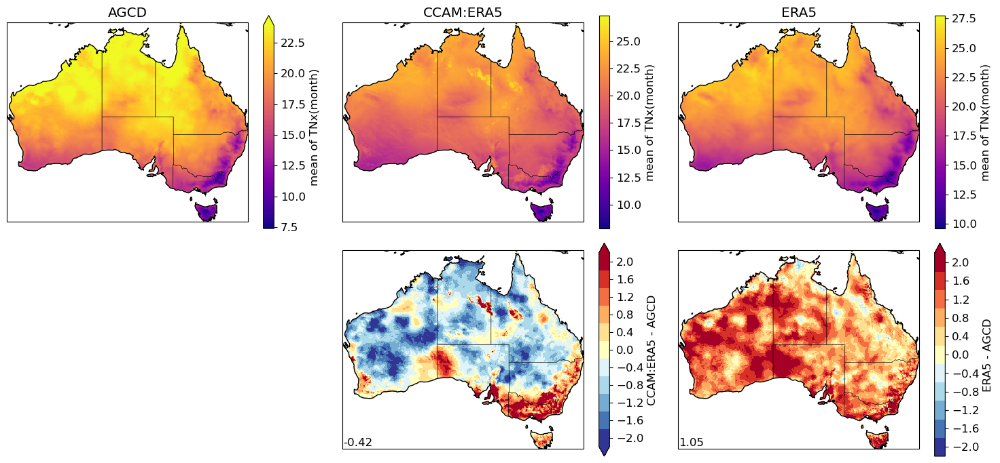

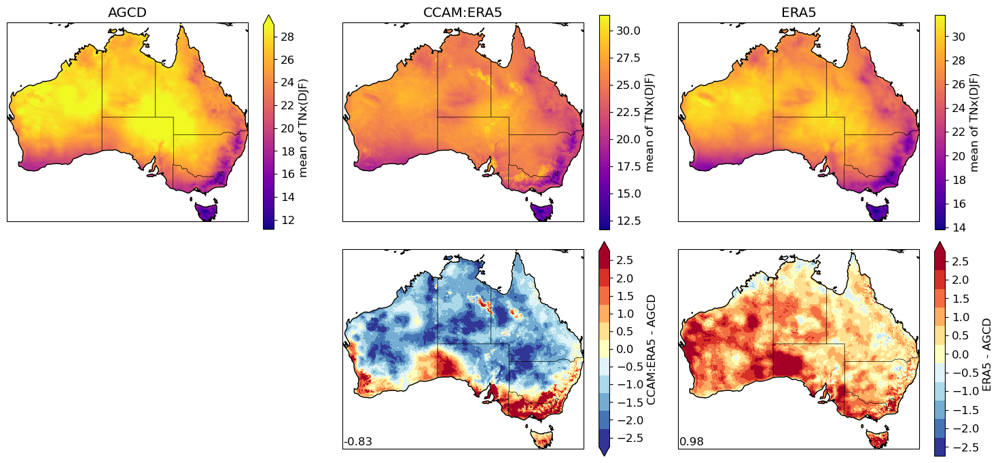

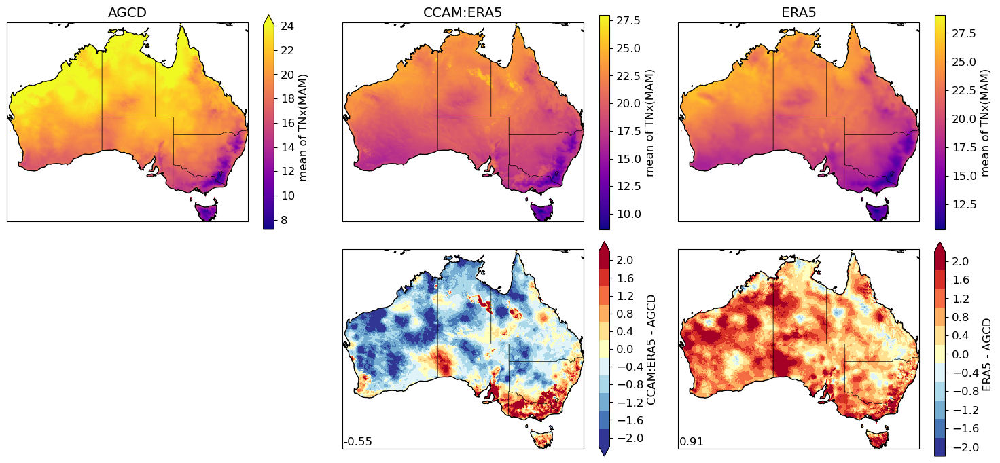

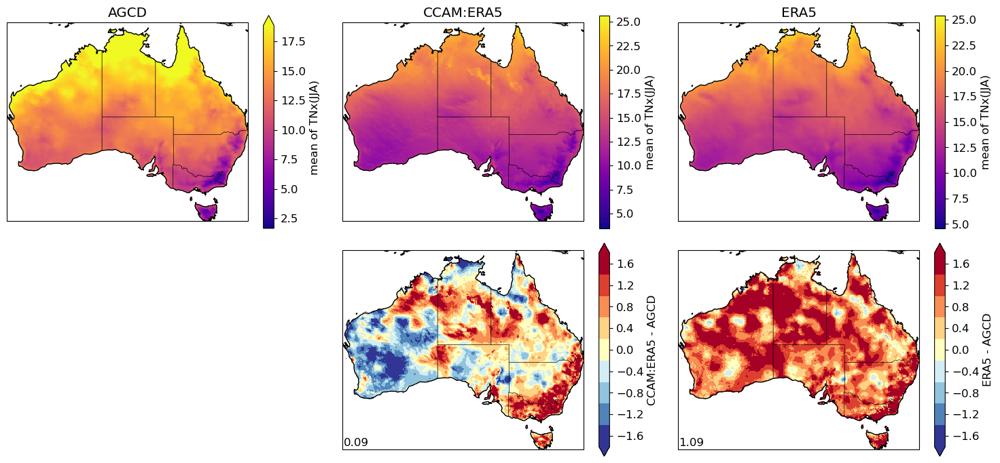

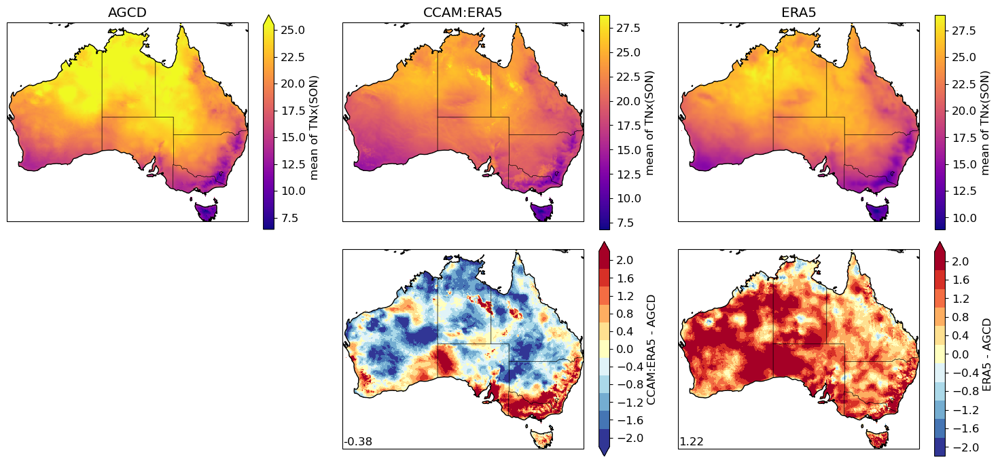

In [7]:
INDEXES = ['TNx', 'TNx:DJF', 'TNx:MAM', 'TNx:JJA', 'TNx:SON']
for index in INDEXES:
    print("index = {:}".format(index))
    
    # check whether the index has special conditions
    index_condition = None
    if not ":" in index:
        # Prepare all the icclim data as per the setup in CONFIGURATIONS
        ds = prepare_data(index)
        clabel = "mean of {index}({freq})".format(index=index, freq=FREQ)
    else:
        index_condition = index.split(":")[1]
        index = index.split(":")[0]
        ds = prepare_data(index, season=index_condition)
        clabel = "mean of {index}({index_condition})".format(index=index, index_condition=index_condition)
    
    ds_target = {}
    for s in SOURCES:
        ds_target[s] = ds[s][index].mean(dim='time')
        ds_target[s] = lib_spatial.apply_region_mask(ds_target[s], 'Australia')
        if 'PRCPTOT' in index:
            ds_target[s] = lib_spatial.apply_agcd_data_mask(ds_target[s])

    if index in ['TNx']:
        cmap_variable = 'temp'
        cmap_class = 'hot'
    
    lib_standards.spatial_plot(ds_target, reference=REFERENCE, 
                               cmap_variable=cmap_variable, cmap_class=cmap_class, 
                               clabel=clabel, plot_difference=True,
                               include_all_data=True, include_diff_avg=True)
    plt.tight_layout()
    plt.savefig("./extremes_paper_figs/tn_%s_mean_%s.png"%(index,index_condition),dpi=300)

# TNn: Minimum daily minimum temperature

index = TNn
False
index = TNn:DJF
False
index = TNn:MAM
False
index = TNn:JJA
False
index = TNn:SON
False


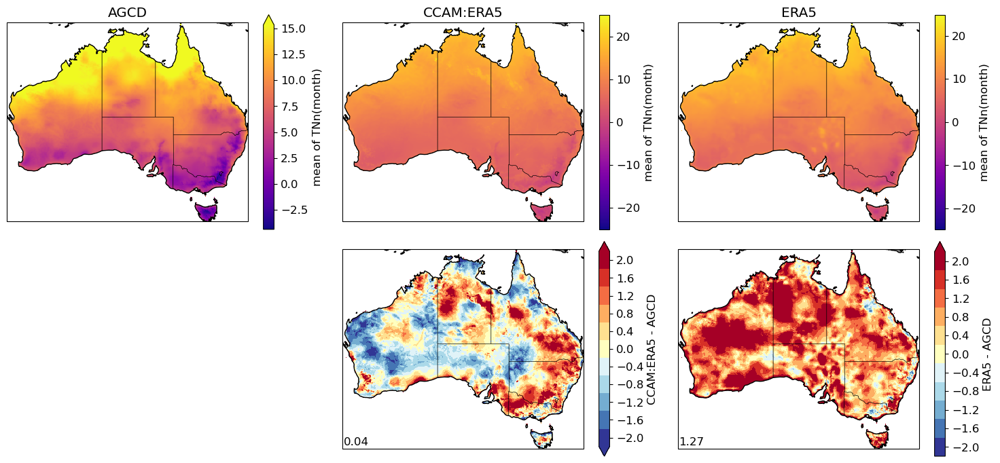

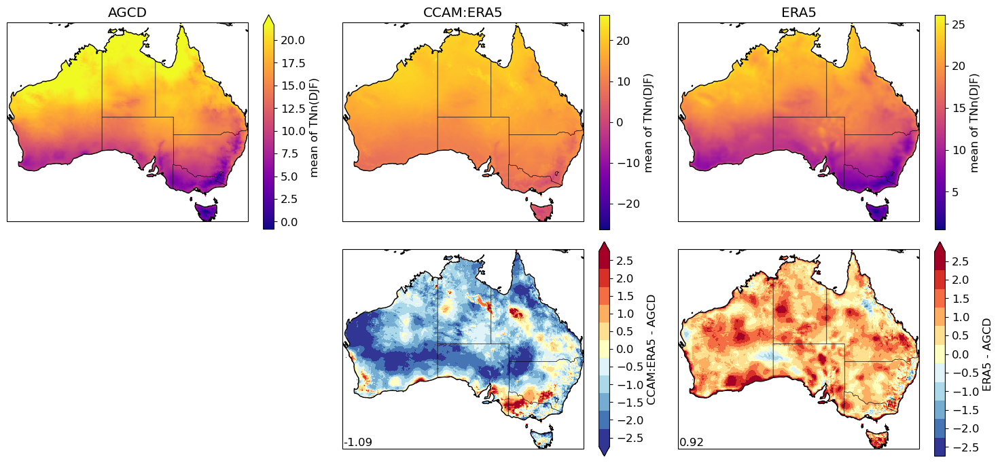

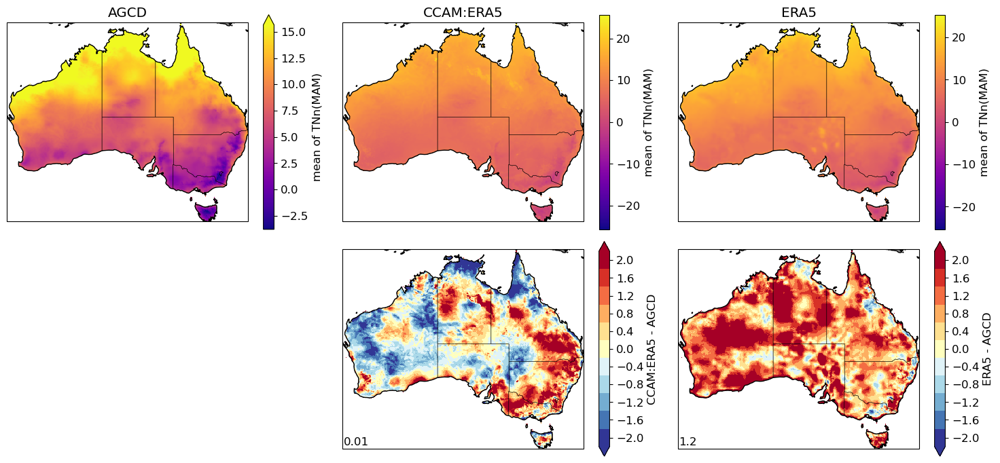

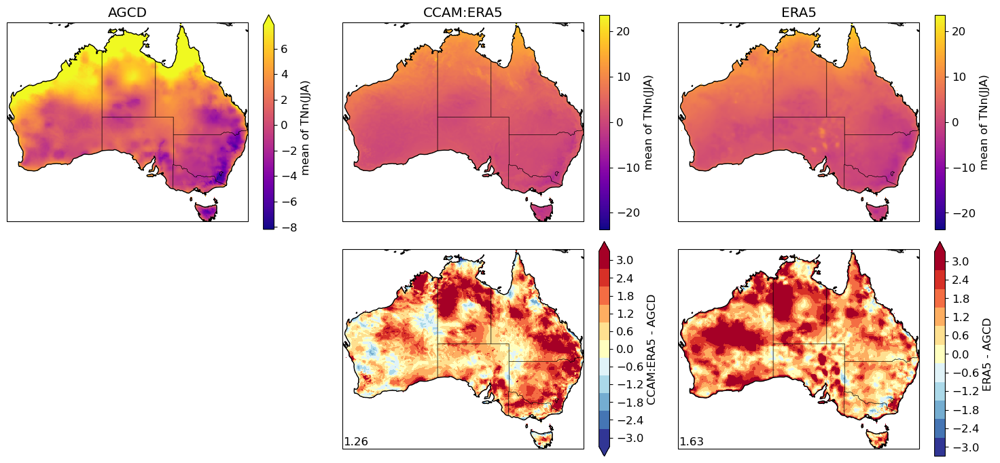

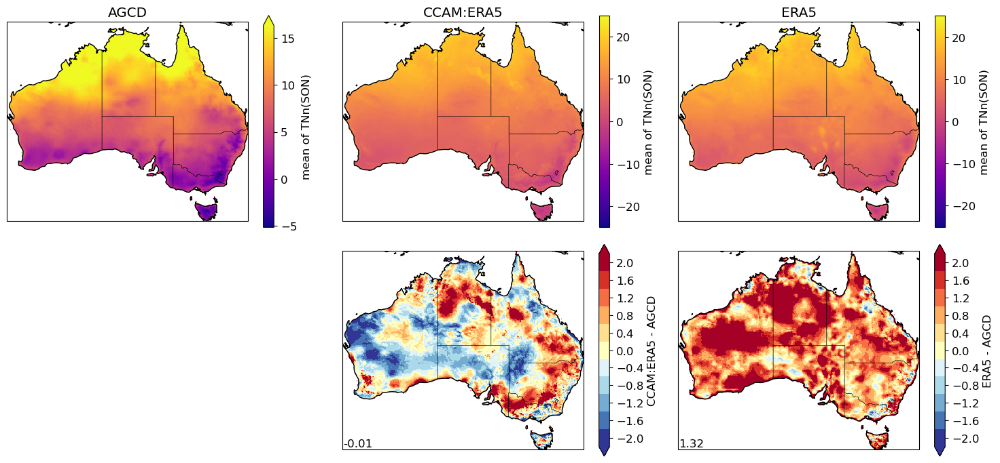

In [8]:
INDEXES = ['TNn', 'TNn:DJF', 'TNn:MAM', 'TNn:JJA', 'TNn:SON']
for index in INDEXES:
    print("index = {:}".format(index))
    
    # check whether the index has special conditions
    index_condition = None
    if not ":" in index:
        # Prepare all the icclim data as per the setup in CONFIGURATIONS
        ds = prepare_data(index)
        clabel = "mean of {index}({freq})".format(index=index, freq=FREQ)
    else:
        index_condition = index.split(":")[1]
        index = index.split(":")[0]
        ds = prepare_data(index, season=index_condition)
        clabel = "mean of {index}({index_condition})".format(index=index, index_condition=index_condition)
    
    ds_target = {}
    for s in SOURCES:
        ds_target[s] = ds[s][index].mean(dim='time')
        ds_target[s] = lib_spatial.apply_region_mask(ds_target[s], 'Australia')
        if 'PRCPTOT' in index:
            ds_target[s] = lib_spatial.apply_agcd_data_mask(ds_target[s])

    if index in ['TNn']:
        cmap_variable = 'temp'
        cmap_class = 'hot'
    
    lib_standards.spatial_plot(ds_target, reference=REFERENCE, 
                               cmap_variable=cmap_variable, cmap_class=cmap_class, 
                               clabel=clabel, plot_difference=True,
                               include_all_data=True, include_diff_avg=True)
    plt.tight_layout()
    plt.savefig("./extremes_paper_figs/tn_%s_mean_%s.png"%(index,index_condition),dpi=300)

# RX1day: Maximum 1-day total precipitation

index = RX1day
False
index = RX1day:DJF
False
index = RX1day:MAM
False
index = RX1day:JJA
False
index = RX1day:SON
False


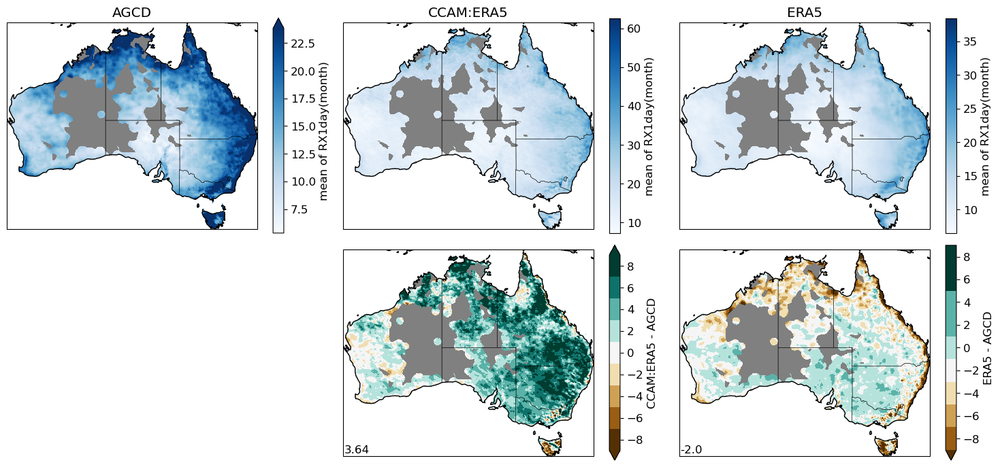

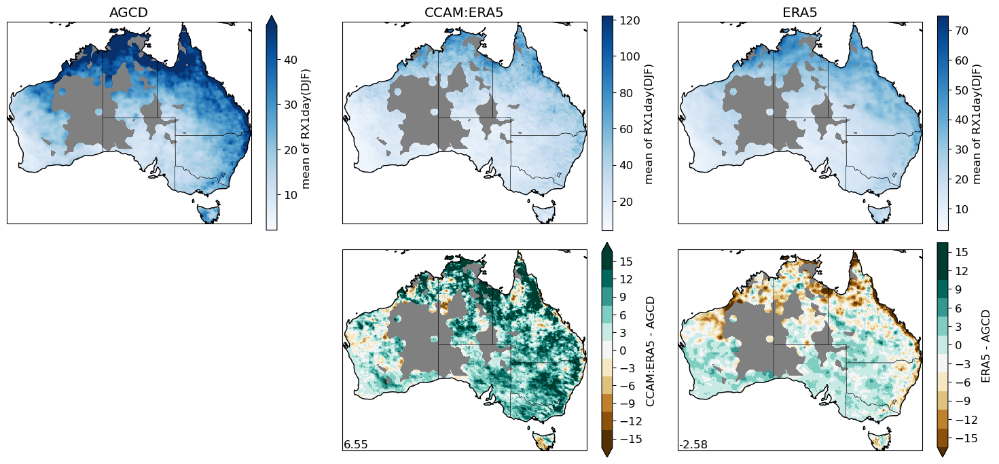

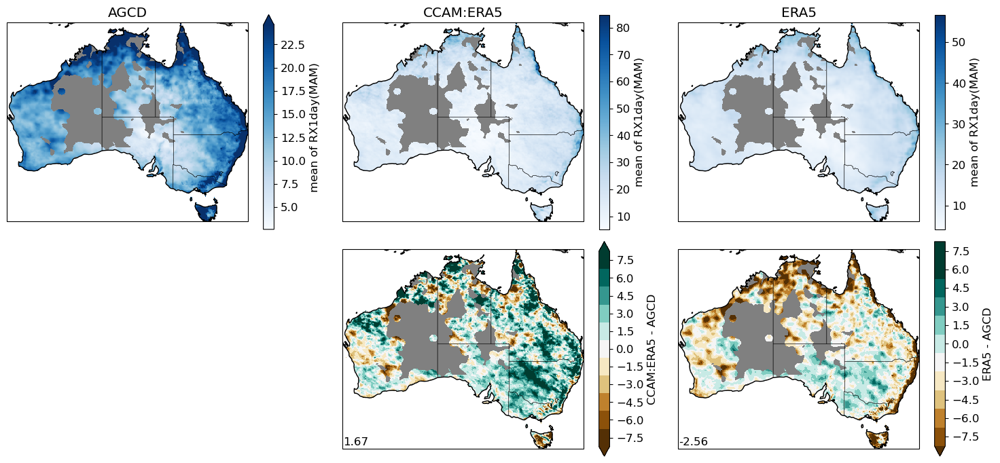

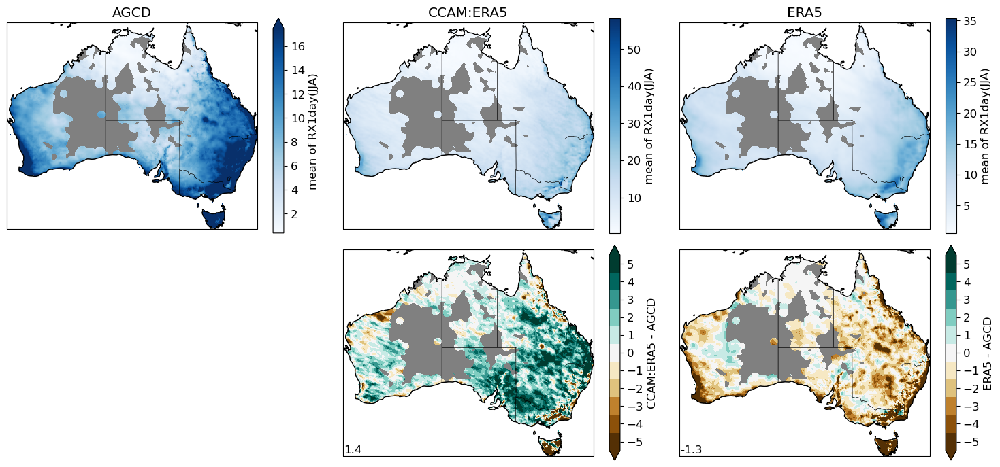

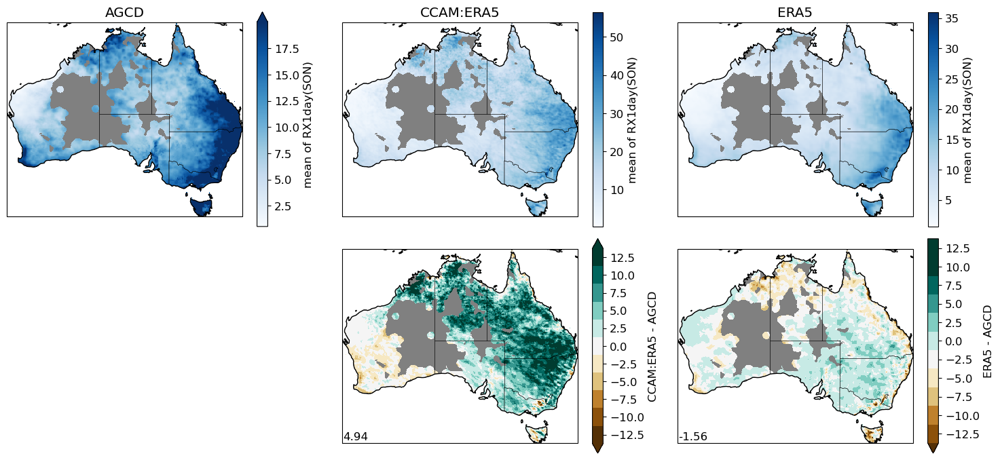

In [9]:
INDEXES = ['RX1day', 'RX1day:DJF', 'RX1day:MAM', 'RX1day:JJA', 'RX1day:SON']
for index in INDEXES:
    print("index = {:}".format(index))
    
    # check whether the index has special conditions
    index_condition = None
    if not ":" in index:
        # Prepare all the icclim data as per the setup in CONFIGURATIONS
        ds = prepare_data(index)
        clabel = "mean of {index}({freq})".format(index=index, freq=FREQ)
    else:
        index_condition = index.split(":")[1]
        index = index.split(":")[0]
        ds = prepare_data(index, season=index_condition)
        clabel = "mean of {index}({index_condition})".format(index=index, index_condition=index_condition)
    
    ds_target = {}
    for s in SOURCES:
        ds_target[s] = ds[s][index].mean(dim='time')
        ds_target[s] = lib_spatial.apply_region_mask(ds_target[s], 'Australia')
        if 'RX1day' in index:
            ds_target[s] = lib_spatial.apply_agcd_data_mask(ds_target[s])

    if index in ["RX1day"]:
        cmap_variable = 'precip'
        cmap_class = 'wet'
    
    lib_standards.spatial_plot(ds_target, reference=REFERENCE, 
                               cmap_variable=cmap_variable, cmap_class=cmap_class, 
                               clabel=clabel, plot_difference=True,
                               include_all_data=True, include_diff_avg=True)
    plt.tight_layout()
    plt.savefig("./extremes_paper_figs/pr_%s_mean_%s.png"%(index,index_condition),dpi=300)

# RX5day: Maximum 5-day total precipitation 

index = RX5day
False
index = RX5day:DJF
False
index = RX5day:MAM
False
index = RX5day:JJA
False
index = RX5day:SON
False


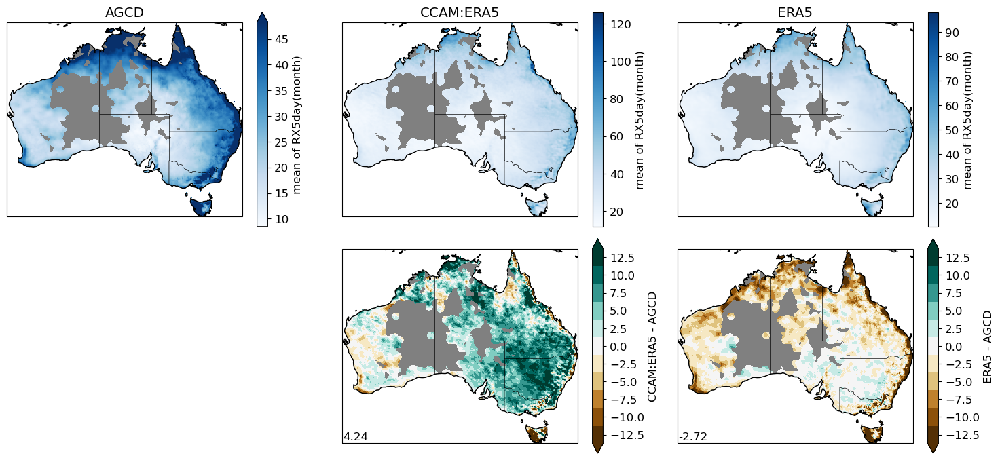

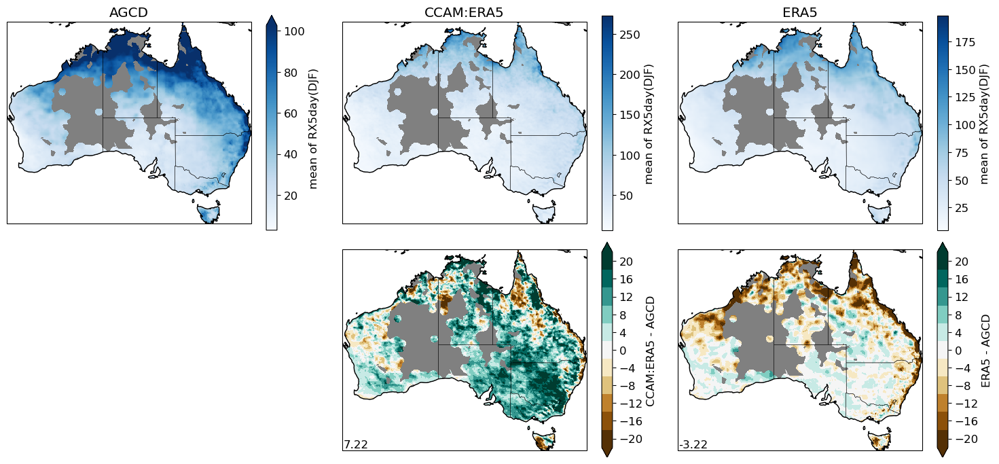

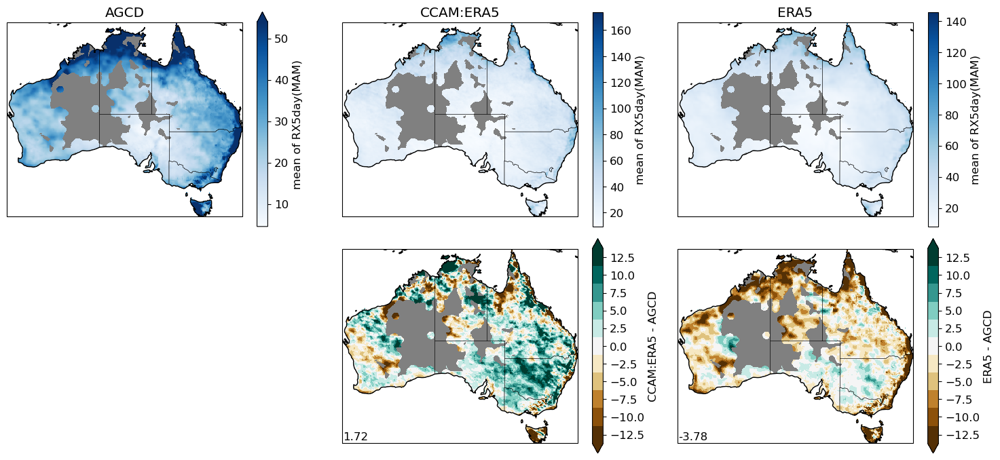

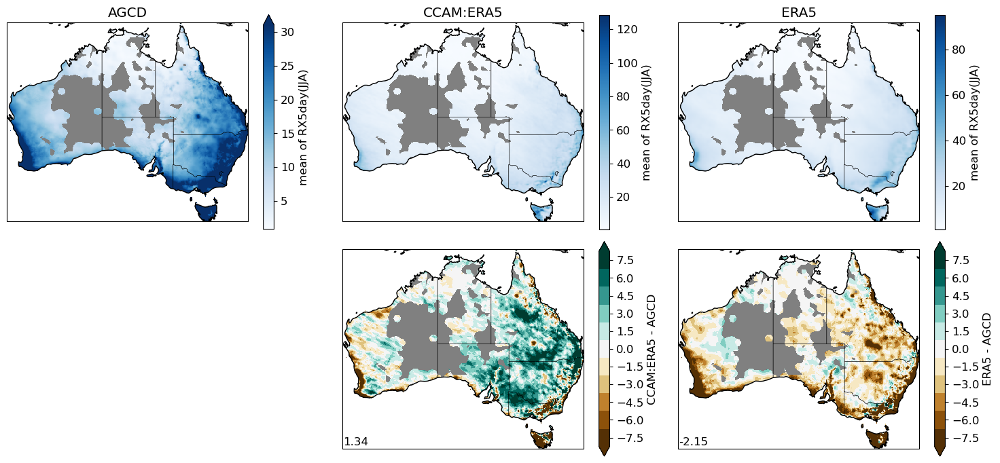

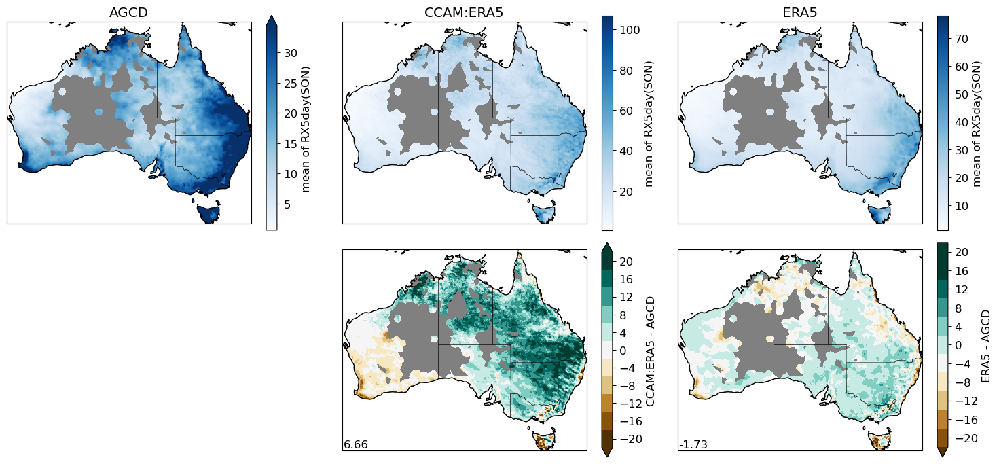

In [10]:
INDEXES = ['RX5day', 'RX5day:DJF', 'RX5day:MAM', 'RX5day:JJA', 'RX5day:SON']
for index in INDEXES:
    print("index = {:}".format(index))
    
    # check whether the index has special conditions
    index_condition = None
    if not ":" in index:
        # Prepare all the icclim data as per the setup in CONFIGURATIONS
        ds = prepare_data(index)
        clabel = "mean of {index}({freq})".format(index=index, freq=FREQ)
    else:
        index_condition = index.split(":")[1]
        index = index.split(":")[0]
        ds = prepare_data(index, season=index_condition)
        clabel = "mean of {index}({index_condition})".format(index=index, index_condition=index_condition)
    
    ds_target = {}
    for s in SOURCES:
        ds_target[s] = ds[s][index].mean(dim='time')
        ds_target[s] = lib_spatial.apply_region_mask(ds_target[s], 'Australia')
        if 'RX5day' in index:
            ds_target[s] = lib_spatial.apply_agcd_data_mask(ds_target[s])

    if index in ["RX5day"]:
        cmap_variable = 'precip'
        cmap_class = 'wet'
    
    lib_standards.spatial_plot(ds_target, reference=REFERENCE, 
                               cmap_variable=cmap_variable, cmap_class=cmap_class, 
                               clabel=clabel, plot_difference=True,
                               include_all_data=True, include_diff_avg=True)
    plt.tight_layout()
    plt.savefig("./extremes_paper_figs/pr_%s_mean_%s.png"%(index,index_condition),dpi=300)